# Workshop traitement de données - Challenge ENS'IA x Neovision 2022

## Imports

In [ ]:
import glob

import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
from PIL import Image

sns.set()

In [ ]:
import tensorflow as tf
from sklearn.metrics import (
    accuracy_score,
    classification_report,
    confusion_matrix,
    roc_auc_score,
    roc_curve,
)
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from tensorflow.keras import *
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [ ]:
from warnings import filterwarnings

filterwarnings("ignore", category=DeprecationWarning)
filterwarnings("ignore", category=FutureWarning)
filterwarnings("ignore", category=UserWarning)

## Chargement du jeu de données

In [ ]:
!wget http://download.tensorflow.org/example_images/flower_photos.tgz; tar -xf flower_photos.tgz

--2022-01-20 15:03:24--  http://download.tensorflow.org/example_images/flower_photos.tgz
Resolving download.tensorflow.org (download.tensorflow.org)... 64.233.189.128, 2404:6800:4008:c01::80
Connecting to download.tensorflow.org (download.tensorflow.org)|64.233.189.128|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 228813984 (218M) [application/x-compressed-tar]
Saving to: ‘flower_photos.tgz’

flower_photos.tgz   100%[===================>] 218.21M   246MB/s    in 0.9s    

2022-01-20 15:03:25 (246 MB/s) - ‘flower_photos.tgz’ saved [228813984/228813984]



In [ ]:
images = []

for path in glob.glob(r"flower_photos/*/*.jpg"):
    image = Image.open(path)

    images.append(
        {
            "path": path,
            "label": path.split("/")[1],
            "width": image.width,
            "height": image.height,
        }
    )


dataset = pd.DataFrame.from_records(images)

dataset.head()

,path,label,width,height
0,flower_photos/tulips/130685040_3c2fcec63e_n.jpg,tulips,320,240
1,flower_photos/tulips/16765283686_0315ae00a8.jpg,tulips,500,333
2,flower_photos/tulips/14087361621_9fefb8dbef.jpg,tulips,500,333
3,flower_photos/tulips/3516269489_cef36e87a6.jpg,tulips,500,281
4,flower_photos/tulips/5813495998_64be1b8ab6_n.jpg,tulips,320,240


## Exploration de données

### Visualisation des images

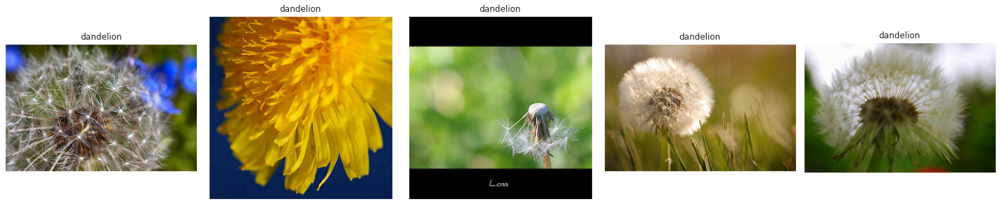

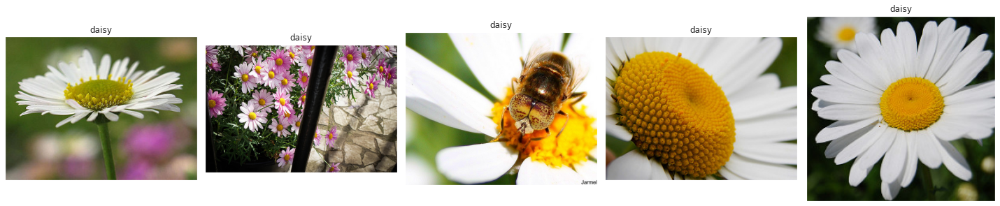

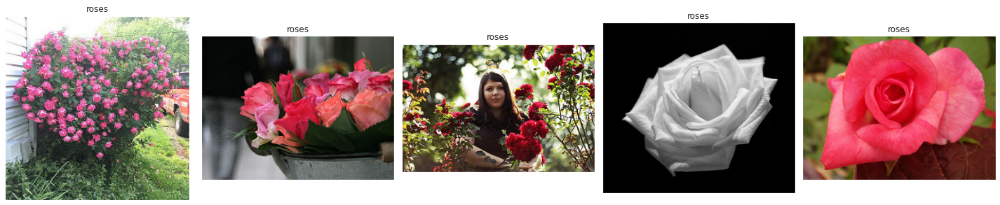

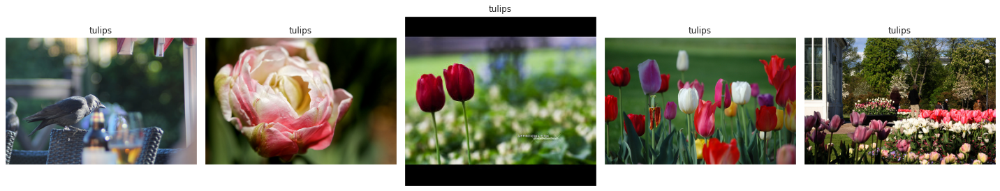

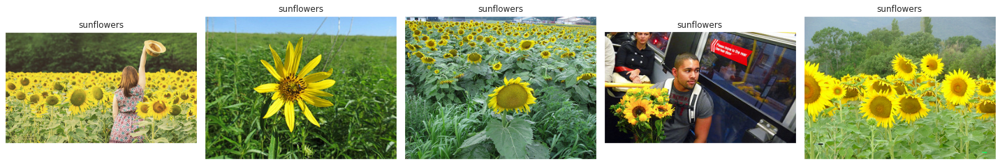

In [ ]:
def show_image_grid(images, titles=None, nrows=5, ncols=5):
    assert len(images) > nrows * ncols

    if titles is not None:
        assert len(titles) > nrows * ncols

    fig, axes = plt.subplots(
        nrows=nrows,
        ncols=ncols,
        figsize=(ncols*4, nrows*4),
        subplot_kw={"xticks": [], "yticks": []},
    )

    for i, ax in enumerate(axes.flat):
        ax.imshow(plt.imread(images[i]))

        if titles is not None:
            ax.set_title(titles[i])

    plt.tight_layout()
    plt.show()


shuffled_dataset = dataset.sample(frac=1)

for label in shuffled_dataset.label.unique():
    subset = shuffled_dataset[shuffled_dataset.label == label]

    show_image_grid(
        images=subset.path.values, titles=subset.label.values, nrows=1, ncols=5
    )

### Statistiques

#### Des targets

* Pour la classification : classes
* Pour la détection : bounding boxes
* etc.

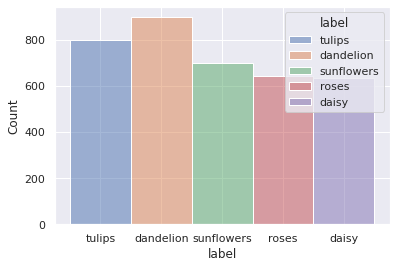

In [ ]:
sns.histplot(data=dataset, x="label", hue="label")

#### Des métadonnées

**Taille des images**

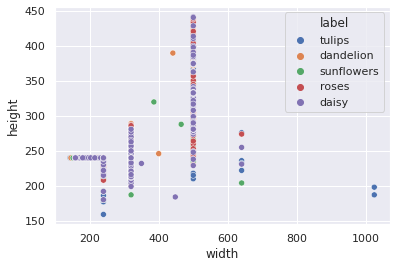

In [ ]:
sns.scatterplot(data=dataset, x="width", y="height", hue="label")

**Aspect ratio**

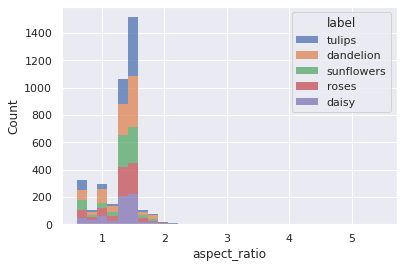

In [ ]:
dataset["aspect_ratio"] = dataset.width / dataset.height

sns.histplot(
    data=dataset, x="aspect_ratio", hue="label", bins=30, multiple="stack", linewidth=0
)

**Résolution**

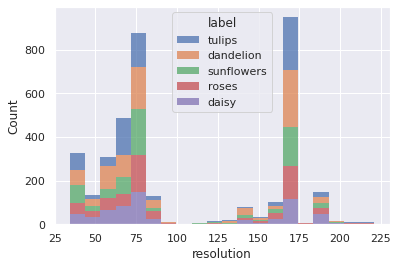

In [ ]:
dataset["resolution"] = (dataset.width * dataset.height) / 1_000
sns.histplot(
    data=dataset, x="resolution", hue="label", bins=20, multiple="stack", linewidth=0
)

### Utilisation d'un outil de visualisation

## Augmentation de données

### Transformations spatiales

### Transformations colorimétriques

## Définition et entrainement d'un modèle

In [ ]:
train_data, test_data = train_test_split(
    dataset, train_size=0.9, random_state=123, shuffle=True
)

In [ ]:
train_data.shape

(3303, 6)

In [ ]:
test_data.shape

(367, 6)

#### Préparation des générateurs

In [ ]:
train_generator = ImageDataGenerator(
    rescale=1.0 / 255,
    validation_split=0.1,
    zoom_range=0.2,
    rotation_range=40,
    shear_range=0.2,
    channel_shift_range=0.2,
    fill_mode="nearest",
    horizontal_flip=True,
)

In [ ]:
test_generator = ImageDataGenerator(rescale=1.0 / 255)

In [ ]:
batch_size = 128

In [ ]:
train_set = train_generator.flow_from_dataframe(
    dataframe=train_data,
    x_col="path",
    y_col="label",
    color_mode="rgb",
    class_mode="categorical",
    subset="training",
    batch_size=batch_size,
    target_size=(200, 200),
)

Found 2973 validated image filenames belonging to 5 classes.


In [ ]:
valid_set = train_generator.flow_from_dataframe(
    dataframe=train_data,
    x_col="path",
    y_col="label",
    color_mode="rgb",
    class_mode="categorical",
    subset="validation",
    batch_size=batch_size,
    target_size=(200, 200),
    shuffle=False,
)

Found 330 validated image filenames belonging to 5 classes.


In [ ]:
test_set = test_generator.flow_from_dataframe(
    dataframe=test_data,
    x_col="path",
    y_col="label",
    color_mode="rgb",
    class_mode="categorical",
    batch_size=batch_size,
    target_size=(200, 200),
    shuffle=False,
)

Found 367 validated image filenames belonging to 5 classes.


In [ ]:
for input_batch, target_batch in train_set:
    print("input batch shape:\t", input_batch.shape)
    print("target batch shape:\t", target_batch.shape)
    break

input batch shape:	 (128, 200, 200, 3)
target batch shape:	 (128, 5)


#### Définition du modèle

In [ ]:
model = models.Sequential()

model.add(layers.Conv2D(12, (3, 3), activation="relu", input_shape=(200, 200, 3)))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(24, (3, 3), activation="relu", padding="same"))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(64, (3, 3), activation="relu", padding="same"))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(128, (2, 2), activation="relu", padding="same"))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(256, (2, 2), activation="relu", padding="same"))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Flatten())
model.add(layers.Dense(512, activation="relu"))
model.add(layers.Dropout(0.5))
model.add(layers.Dense(5, activation="softmax"))

In [ ]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_5 (Conv2D)           (None, 198, 198, 12)      336       
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 99, 99, 12)       0         
 2D)                                                             
                                                                 
 conv2d_6 (Conv2D)           (None, 99, 99, 24)        2616      
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 49, 49, 24)       0         
 2D)                                                             
                                                                 
 conv2d_7 (Conv2D)           (None, 49, 49, 64)        13888     
                                                                 
 max_pooling2d_7 (MaxPooling  (None, 24, 24, 64)      

#### Entraînement

In [ ]:
model.compile(
    optimizer=optimizers.RMSprop(lr=0.001),
    loss="categorical_crossentropy",
    metrics=["accuracy"],
)

In [ ]:
history = model.fit(train_set, validation_data=valid_set, epochs=10)

Epoch 1/10
24/24 [==============================] - 40s 2s/step - loss: 1.5913 - accuracy: 0.2832 - val_loss: 1.4183 - val_accuracy: 0.3424
Epoch 2/10
24/24 [==============================] - 37s 2s/step - loss: 1.4030 - accuracy: 0.4053 - val_loss: 1.1866 - val_accuracy: 0.4879
Epoch 3/10
24/24 [==============================] - 38s 2s/step - loss: 1.2369 - accuracy: 0.4820 - val_loss: 1.2110 - val_accuracy: 0.4455
Epoch 4/10
24/24 [==============================] - 37s 2s/step - loss: 1.1206 - accuracy: 0.5382 - val_loss: 1.0799 - val_accuracy: 0.5515
Epoch 5/10
24/24 [==============================] - 37s 2s/step - loss: 1.0783 - accuracy: 0.5752 - val_loss: 1.0133 - val_accuracy: 0.5636
Epoch 6/10
24/24 [==============================] - 38s 2s/step - loss: 1.0253 - accuracy: 0.5937 - val_loss: 0.8963 - val_accuracy: 0.6485
Epoch 7/10
24/24 [==============================] - 38s 2s/step - loss: 0.9696 - accuracy: 0.6176 - val_loss: 0.8922 - val_accuracy: 0.6091
Epoch 8/10
24/24 [==

In [ ]:
model.save('model.h5')

In [ ]:
model = models.load_model('model.h5')

#### Résumé des résultats sur le jeu de test

In [ ]:
model_results = model.evaluate(test_set, verbose=False)
print("test loss:  " + "%.4f" % model_results[0])
print("test accuracy:  " + "%.2f" % model_results[1])

test loss:  0.8362
test accuracy:  0.67


## Evaluation de modèles

### Métriques

#### Loss (train, val)

In [ ]:
history_df = pd.DataFrame(history.history)
history_df["epoch"] = history_df.index

history_df.head()

,loss,accuracy,val_loss,val_accuracy,epoch
0,1.591268,0.283216,1.418326,0.342424,0
1,1.403021,0.405315,1.186592,0.487879,1
2,1.236937,0.482005,1.210956,0.445455,2
3,1.120624,0.538177,1.079858,0.551515,3
4,1.078262,0.575177,1.013322,0.563636,4


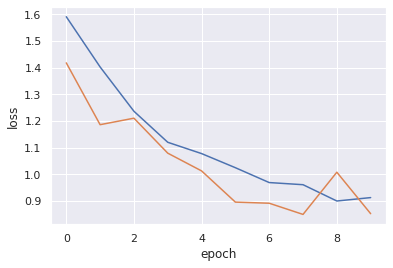

In [ ]:
sns.lineplot(data=history_df, x="epoch", y="loss")
sns.lineplot(data=history_df, x="epoch", y="val_loss")

#### Accuracy, mAP, etc.

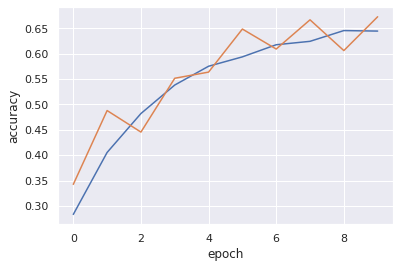

In [ ]:
sns.lineplot(data=history_df, x="epoch", y="accuracy")
sns.lineplot(data=history_df, x="epoch", y="val_accuracy")

### Visualisations

In [ ]:
raw_valid_predictions = model.predict(valid_set)

In [ ]:
valid_predicted_labels = raw_valid_predictions.argmax(axis=1)

In [ ]:
labels = sorted(test_set.class_indices, key=test_set.class_indices.get)

labels

['daisy', 'dandelion', 'roses', 'sunflowers', 'tulips']

#### Matrice de confusion

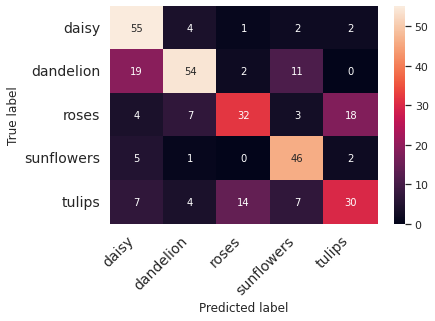

In [ ]:
cm = confusion_matrix(valid_set.classes, valid_predicted_labels)

hexo

#### Erreurs les plus importantes

In [ ]:
results = pd.DataFrame.from_dict(
    {
        "path": valid_set.filenames,
        "groundtruth": [labels[label_id] for label_id in valid_set.classes],
        "pred": [labels[label_id] for label_id in valid_predicted_labels],
        "confidence": [
            raw_valid_predictions[i][pred]
            for i, pred in enumerate(valid_predicted_labels)
        ],
    }
)

In [ ]:
errors = results.groundtruth != results.pred

confident_errors = results[errors].sort_values("confidence", ascending=False)

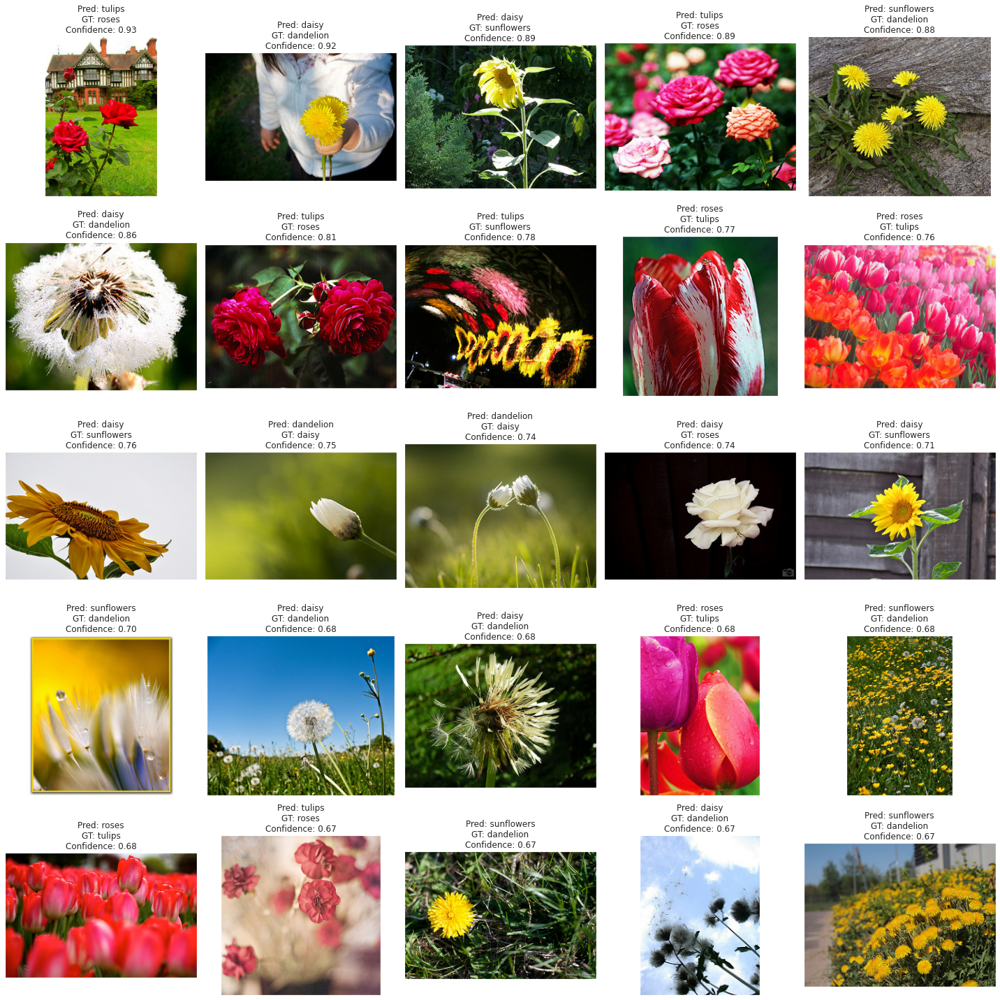

In [ ]:
show_image_grid(
    images=confident_errors.path.values,
    titles=[
        f"Pred: {pred}\nGT: {groundtruth}\nConfidence: {confidence:.2f}"
        for groundtruth, pred, confidence in zip(
            confident_errors.groundtruth.values,
            confident_errors.pred.values,
            confident_errors.confidence.values
        )
    ],
    nrows=5,
    ncols=5,
)

In [ ]:
correct = results.groundtruth == results.pred

confident_correct = results[correct].sort_values("confidence", ascending=False)

confident_correct

,path,groundtruth,pred,confidence
158,flower_photos/daisy/6089825811_80f253fbe1.jpg,daisy,daisy,0.999517
267,flower_photos/daisy/14087947408_9779257411_n.jpg,daisy,daisy,0.998079
264,flower_photos/daisy/7629784968_b953501902_n.jpg,daisy,daisy,0.997632
299,flower_photos/daisy/3764116502_f394428ee0_n.jpg,daisy,daisy,0.995570
220,flower_photos/daisy/1150395827_6f94a5c6e4_n.jpg,daisy,daisy,0.994514
...,...,...,...,...
139,flower_photos/daisy/10172567486_2748826a8b.jpg,daisy,daisy,0.333432
34,flower_photos/daisy/2666572212_2caca8de9f_n.jpg,daisy,daisy,0.330857
274,flower_photos/dandelion/14576445793_582aa6446b...,dandelion,dandelion,0.319940
191,flower_photos/daisy/5459481183_18d2d49e44_m.jpg,daisy,daisy,0.295471


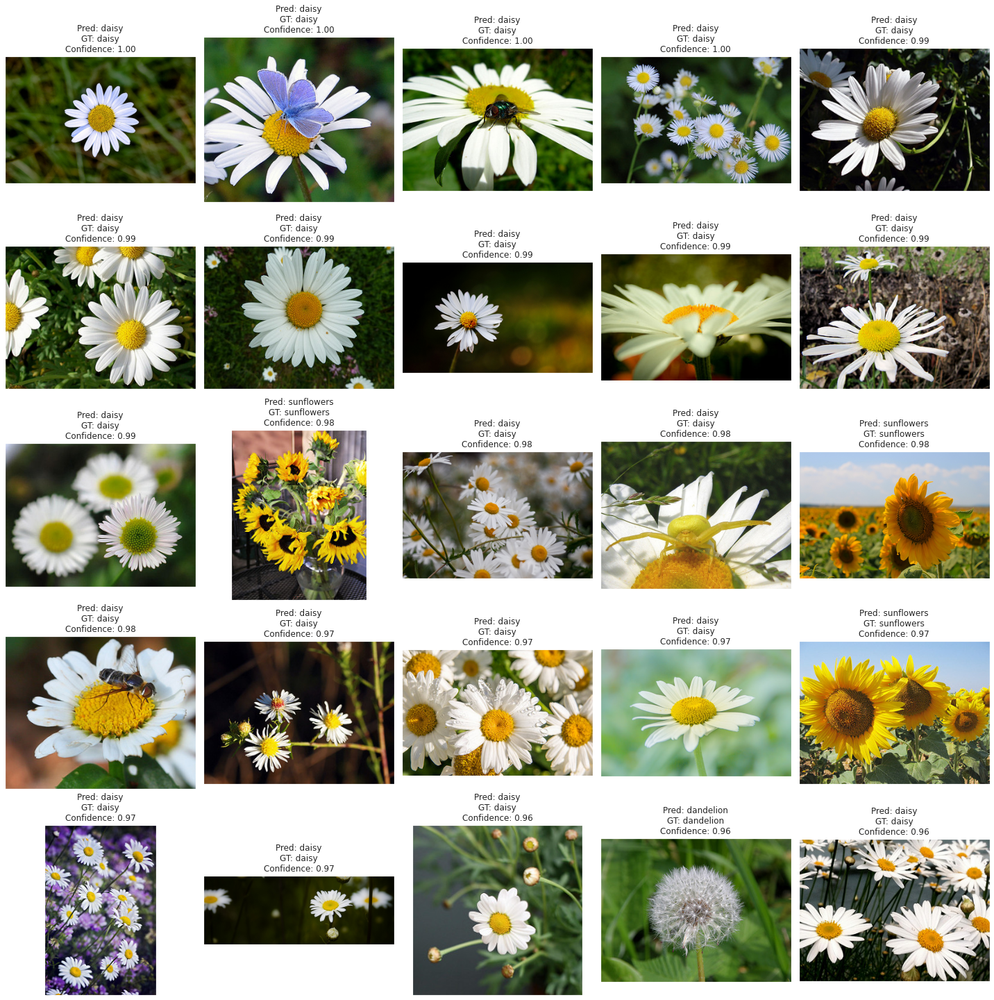

In [ ]:
show_image_grid(
    images=confident_correct.path.values,
    titles=[
        f"Pred: {pred}\nGT: {groundtruth}\nConfidence: {confidence:.2f}"
        for groundtruth, pred, confidence in zip(
            confident_correct.groundtruth.values,
            confident_correct.pred.values,
            confident_correct.confidence.values
        )
    ],
    nrows=5,
    ncols=5,
)